In [1]:
import functools
from typing import List

import numpy as np
import jax
import jax.numpy as jnp

from jax.experimental.pallas.ops.tpu.megablox.gmm import gmm
from jax.experimental.shard_map import shard_map
from jax.sharding import Mesh, NamedSharding, PartitionSpec

/home/lsiyuan_google_com/miniconda3/envs/torch312/lib/python3.12/site-packages/jax/_src/cloud_tpu_init.py:86: UserWarning: Transparent hugepages are not enabled. TPU runtime startup and shutdown time should be significantly improved on TPU v5e and newer. If not already set, you may need to enable transparent hugepages in your VM image (sudo sh -c "echo always > /sys/kernel/mm/transparent_hugepage/enabled")
  warnings.warn(


In [2]:
P = PartitionSpec

mesh = Mesh(jax.devices(), ('x',))

seq_p_spec = P('x',)
seq_p_sharding = NamedSharding(mesh, seq_p_spec)

dtype = jnp.bfloat16
n_shards = mesh.size
n_tokens = 128

In [3]:
def print_sharded(x):
    if not isinstance(x, jax.Array):
        print("not a JAX arry")
        return
    print(f"x shape: {x.shape} x sharding: {x.sharding}")
    if not x.is_fully_replicated:
        for i, shard in enumerate(x.addressable_shards):
            print(f"shard {i}: {shard.data}")
    else:
        print(f"x is fully replicated: \n {x}")

In [4]:
shmapped_ra2a = shard_map(functools.partial(jax.lax.ragged_all_to_all, axis_name='x'),
                          mesh=mesh,
                          in_specs=(seq_p_spec,
                                    seq_p_spec,
                                    seq_p_spec,
                                    seq_p_spec,
                                    seq_p_spec,
                                    seq_p_spec),
                          out_specs=seq_p_spec,
                          check_rep=False)

## Compute ra2a metadata

The input to the metadata cal function is the send_sizes, specifying how much data to send for each dest. The shape of `send_sizes` is `[EP*SIZE * EP_SIZE]`, partitioned along `EP` dim. Local shape is `[EP_SIZE]`

The key of the logic is based on the below observation

1. Need an all-gather on the `send_sizes` to calculate the metadata. All gathred `send_sizes` has shape `[EP_SIZE, EP_SIZE]`
2. input_offsets equals to `cumsum(ag_send_sizes, axis=1)`, then append full zero column on the left side, and discard the last column
3. output_offsets equals to `cumsum(ag_send_sizes, axis=0)`, then append full zero row on the top, and discard the last row
4. recv size is the transpose of `ag_send_sizes`, then partition along `axis=0`

### metadata for the reverse ra2a operation

Key observations

1. `recv_sizes` of the reverse ra2a is the same as the `send_sizes` of the forward ra2a
2. `send_sizes` of the reverse ra2a is the same as the `recv_sizes` of the forward ra2a
3. `input_offsets` of the reverse ra2a is the transpose of `output_offsets` of the forward ra2a
4. `output_offsets` of the reverse ra2a is the transpose of `input_offsets` of the forward ra2a

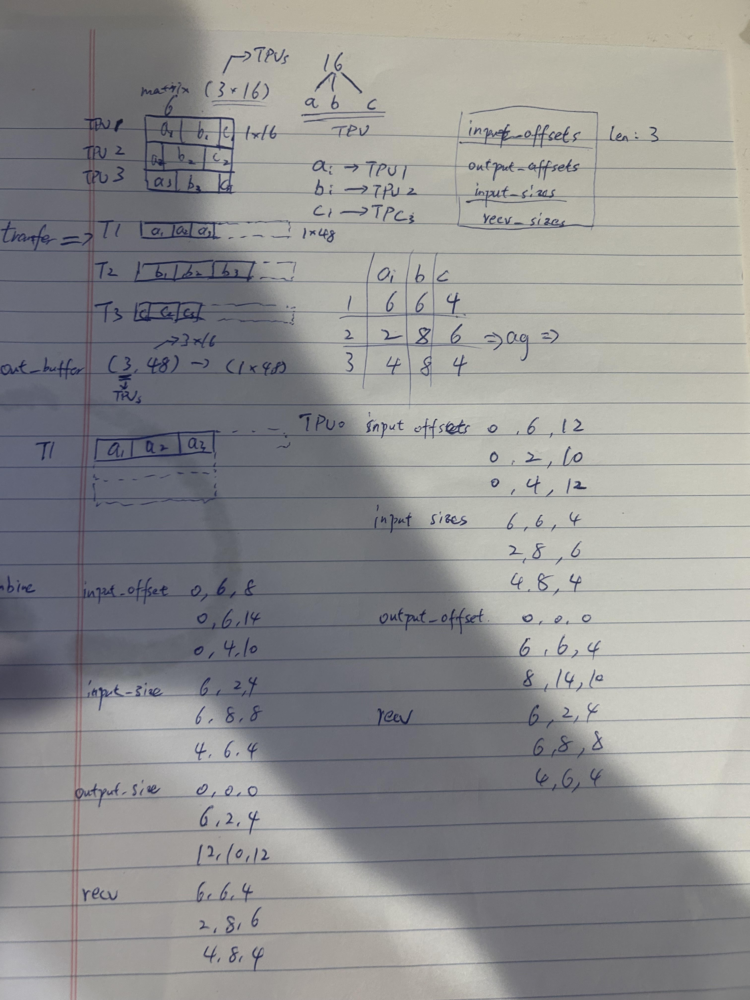

In [5]:
@functools.partial(shard_map,
                   mesh=mesh,
                   in_specs=(P('x'), P('x')),
                   out_specs=(P('x'), P('x'), P('x'), P('x'), P('x'), P('x')),
                   check_rep=False)
def compute_ra2a_metadata2(send_sizes: jax.Array, # int32[EP_SIZE], indicating the number of tokens to send to each EP rank
                           ep_rank: jax.Array): # arange(ep_size) used for indexing inside shard_mapd
    all_send_sizes = jax.lax.all_gather(send_sizes, 'x')
    row_cum_sum = jnp.cumsum(all_send_sizes, axis=1)
    col_cum_sum = jnp.cumsum(all_send_sizes, axis=0)

    def _append_zero_and_remove_last(x, append_row):
        '''
        Append an all-zero row/col and remove the last row/col from the
        original input.

        Args:
        x (jax.Array): 2D Array
        append_row (bool): if append along row
        '''
        if append_row:
            zero_row = jnp.zeros((1, x.shape[1]), dtype=x.dtype)
            res = jnp.concatenate([zero_row, x[:-1]], axis=0)
        else:
            zero_col = jnp.zeros((x.shape[0], 1), dtype=x.dtype)
            res = jnp.concatenate([zero_col, x[:, :-1]], axis=1)
        return res

    full_input_offsets = _append_zero_and_remove_last(row_cum_sum, False)
    full_ouptut_offsets = _append_zero_and_remove_last(col_cum_sum, True)
    all_recv_sizes = all_send_sizes.transpose()

    input_offsets = full_input_offsets[ep_rank[0]]
    ouptut_offsets = full_ouptut_offsets[ep_rank[0]]
    recv_sizes = all_recv_sizes[ep_rank[0]]
    
    full_combine_input_offsets = full_ouptut_offsets.transpose()
    full_combine_output_offsets = full_input_offsets.transpose()

    combine_send_sizes = all_recv_sizes[ep_rank[0]]

    combine_input_offsets = full_combine_input_offsets[ep_rank[0]]
    combine_output_offsets = full_combine_output_offsets[ep_rank[0]]
    
    return input_offsets, ouptut_offsets, recv_sizes, combine_send_sizes, combine_input_offsets, combine_output_offsets

# Input data

In [6]:
# Simple 1D arange input
dtype = jnp.bfloat16
n_shards = mesh.size
n_tokens = 128
seq_p_spec = P('x',)
seq_p_sharding = NamedSharding(mesh, seq_p_spec)
x = jnp.arange(n_tokens).astype(dtype)
x = jax.device_put(x, seq_p_sharding)


output_buffer_shape = (x.shape[0] * n_shards, *x.shape[1:])
output_buffer = jnp.zeros(output_buffer_shape).astype(x.dtype)
output_buffer = jax.device_put(output_buffer, seq_p_sharding)

# Use 2D input
# D = 512
# x = jax.random.uniform(jax.random.PRNGKey(0), shape=(n_tokens, D), dtype=jnp.bfloat16)
# output_buffer = jnp.zeros((x.shape[0] * n_shards, *x.shape[1:]), dtype=x.dtype)
# x = jax.device_put(x, seq_p_sharding)
# output_buffer = jax.device_put(output_buffer, seq_p_sharding)

def gen_send_sizes_complex(n_tokens, n_shards):
    n_local_tok = n_tokens // n_shards
    histo = np.zeros(n_shards, dtype=np.int32)
    for _ in range(n_local_tok):
        # Uniform dist for EP rank assginment.
        ep_rank = np.random.randint(0, n_shards)
        histo[ep_rank] += 1
    return histo

send_sizes_shards = []
for _ in range(n_shards):
    send_size = jnp.array(gen_send_sizes_complex(n_tokens, n_shards))
    print(send_size)
    send_sizes_shards.append(send_size)

# In real case, this comes from gating and sorting.
send_sizes = jnp.concatenate(send_sizes_shards)
send_sizes = jax.device_put(send_sizes, seq_p_sharding)

ep_rank = jax.device_put(jnp.arange(n_shards), seq_p_sharding)


[3 1 3 0 2 3 2 2]
[4 1 1 2 1 3 1 3]
[3 3 4 2 1 2 0 1]
[5 1 4 2 1 2 0 1]
[3 3 2 2 2 2 1 1]
[4 1 2 3 2 2 1 1]
[1 2 1 2 4 2 1 3]
[1 1 3 1 2 2 3 3]


In [7]:
input_offsets, output_offsets, recv_sizes, combine_send_sizes, combine_input_offsets, combine_output_offsets = compute_ra2a_metadata2(send_sizes, ep_rank)
combine_recv_sizes = send_sizes

In [8]:
dispatch_output = shmapped_ra2a(x, output_buffer, input_offsets, send_sizes, output_offsets, recv_sizes)

In [9]:
def verify_ra2a_output(
    x: jax.Array, # [n_tokens, D]
    send_sizes_shards: List[jax.Array], # n_shards of Array, each one is [n_shards],
                                        # send_sizes[i][j] is for seq parallel rank, the number of tokens send to ep rank j
    ra2a_output: jax.Array): # [n_tokens * n_shards, D])

    n_shards = len(send_sizes_shards)
    assert len(x.addressable_shards) == n_shards
    assert len(ra2a_output.addressable_shards) == n_shards

    send_sizes_shards_np, x_np, ra2a_output_np = jax.tree_util.tree_map(np.asarray, (send_sizes_shards, x, ra2a_output))
    x_global_shape = x.shape
    x_np = x_np.reshape(n_shards, x_global_shape[0] // n_shards, *x_global_shape[1:])

    ra2a_out_shape = ra2a_output_np.shape
    ra2a_output_np = ra2a_output_np.reshape(n_shards, ra2a_out_shape[0] // n_shards, *ra2a_out_shape[1:])
    
    # print("x_np shape: ", x_np.shape)
    # print(send_sizes_shards_np, x_np, ra2a_output_np)
    
    send_offset_shards = []
    for send_size in send_sizes_shards:
        send_offset = np.concatenate([np.array([0], dtype=send_size.dtype), np.cumsum(send_size)[:-1]])
        send_offset_shards.append(send_offset)

    output_ref = np.zeros_like(ra2a_output_np)

    
    for src_col in range(n_shards):
        # col
        output_col_offset = 0
        for src_row in range(n_shards):
            # row
            src_size = send_sizes_shards_np[src_row][src_col]
            send_offset = send_offset_shards[src_row][src_col]
            # print(f"copy x_np[{src_row}][{send_offset}] to output[{src_col}][{output_col_offset}] of len {src_size}")
            output_ref[src_col][output_col_offset:output_col_offset+src_size] = x_np[src_row][send_offset:send_offset + src_size]
            output_col_offset += src_size

    # print("check ra2a_output_np ", ra2a_output_np)
    # print("check output_ref ", output_ref)
    diff = output_ref - ra2a_output_np
    return diff, output_ref, ra2a_output_np

In [10]:
diff, output_ref, ra2a_output_np = verify_ra2a_output(x, send_sizes_shards, dispatch_output)
assert np.max(diff) == 0

In [11]:
combine_output_buffer = jnp.zeros_like(x)
dispatch_output = shmapped_ra2a(dispatch_output,
                                combine_output_buffer,
                                combine_input_offsets,
                                combine_send_sizes,
                                combine_output_offsets,
                                combine_recv_sizes)
print(dispatch_output.shape)
print(dispatch_output - x)

(128,)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
